# **💻 Author Information**

**Name:** CHUA JINGXUAN

**Taylor's Student ID:** 0365376

**Email:** 0365376@sd.taylors.edu.my

**Course:** PRJ70105 Capstone Project 2

**Note:** This Jupyter Notebook was created by CHUA JINGXUAN. If you find any issues, have questions, or want to provide feedback, please don't hesitate to reach out. Thank you for exploring this notebook!

**Date Written**: 02/12/2024 (MON)

**Last Updated**: 03/12/2024 (TUE)



[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/Kanon14) <a href="https://www.linkedin.com/in/chua-jingxuan-51a300173" target="_blank" style="margin-left: 10px;">
    <img src="https://upload.wikimedia.org/wikipedia/commons/1/19/LinkedIn_logo.svg" alt="LinkedIn Icon" width="80" height="22">
</a>

---

# 🔬 **Experiment for E-Waste Detection and Classification: YOLOv9t**

# ⚙️ **1.0 Environment Setup**

## 1.1 Connecting to GPU for Training Acceleration
Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Tue Dec  3 08:41:23 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   33C    P8              12W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## 1.2 Installing Ultralytics

In [2]:
%pip install ultralytics supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Setup complete ✅ (12 CPUs, 53.0 GB RAM, 32.6/235.7 GB disk)


## 1.3 Import Essential Libraries

In [3]:
import requests
import zipfile
import os
import glob
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image as IPyImage, display

# ⬇️ **2.0 Download E-Waste Image Dataset**

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [4]:
HOME = os.getcwd()
print(HOME)

/content


In [5]:
import gdown

# URL of the file to be downloaded
url = "https://drive.google.com/file/d/1V3pJ-68VZ_3ICHfleet44ztRYHEJ4e-9/view?usp=sharing" # YOLOv9 TXT Annotation file
file_id = url.split("/")[-2] # Extract the file ID from the URL
prefix = "https://drive.google.com/uc?/export=download&id=" # Prefix for direct Google Drive download links

# Download the file using gdown
gdown.download(prefix + file_id)
print("Data downloaded!") # Confirm that the download is complete

Downloading...
From (original): https://drive.google.com/uc?/export=download&id=1V3pJ-68VZ_3ICHfleet44ztRYHEJ4e-9
From (redirected): https://drive.google.com/uc?%2Fexport=download&id=1V3pJ-68VZ_3ICHfleet44ztRYHEJ4e-9&confirm=t&uuid=7f773520-0115-4c5a-995c-91ca3d9a422b
To: /content/e-waste-kanon-10k-yolov9.zip
100%|██████████| 428M/428M [00:10<00:00, 40.8MB/s]

Data downloaded!


In [6]:
# Unzip the dataset file and delete the original ZIP file to save storage space
!unzip e-waste-kanon-10k-yolov9.zip
!rm -rf e-waste-kanon-10k-yolov9.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/labels/printer-272-_jpg.rf.74abb3d23cca3e5b3a6916c232893f88.txt  
  inflating: train/labels/printer-273-_jpg.rf.a17c854ee0760e0b2d46d8f7bb2fb2dd.txt  
  inflating: train/labels/printer-275-_jpg.rf.a1efef1605b16daf219133bbada84fd9.txt  
  inflating: train/labels/printer-277-_jpg.rf.2724a960ab70fbe2c67dd83ffbb9fb3a.txt  
  inflating: train/labels/printer-278-_jpg.rf.35bf6d945ec6fcd4ac83f082ee0ed7a6.txt  
  inflating: train/labels/printer-28-_jpg.rf.f77ca66d9a7be97160946560d9f9627a.txt  
 extracting: train/labels/printer-280-_jpg.rf.1322acc8750fe6c670c198c11ca8a937.txt  
  inflating: train/labels/printer-282-_jpg.rf.d260e17601fe3dac7a6ffaf028ed7d4d.txt  
  inflating: train/labels/printer-284-_jpg.rf.ba0aa10e654da151c9c69140eca88f83.txt  
  inflating: train/labels/printer-285-_jpg.rf.40d8993ae6533611f890c478b51ee28f.txt  
  inflating: train/labels/printer-286-_jpg.rf.e5ea6954ea0836c3f334f8a3280efea3.txt  
 extracting: tr

In [7]:
# Display the contents of the YAML file that contains the configuration or dataset information
%cat data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 20
names: ['air-cond', 'audio-set', 'battery', 'fan', 'fridge', 'kettle', 'keyboard', 'laptop', 'light-source', 'microwave', 'mouse', 'pcb', 'printer', 'remote', 'smartphone', 'telephone', 'tv', 'usb', 'vape', 'washing-machine']

roboflow:
  workspace: computer-vision-learning-touhj
  project: capstone-kanon-2
  version: 3
  license: CC BY 4.0
  url: https://universe.roboflow.com/computer-vision-learning-touhj/capstone-kanon-2/dataset/3

# 🛠️ **3.0 Customize YOLOv9t Model Training**

In [9]:
# Change the current working directory to the HOME directory
%cd {HOME}

# Train a YOLOv9 model for object detection with the specified parameters
!yolo task=detect mode=train \
model=yolov9t.pt \
data={HOME}/data.yaml \
epochs=100 batch=16 lr0=0.001 imgsz=640 patience=10 save_period=10 \
project=e-waste-yolov9t name=train \
plots=True \
exist_ok=True \
save=True

/content
100% 4.74M/4.74M [00:00<00:00, 84.1MB/s]
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov9t.pt, data=/content/data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=None, workers=8, project=e-waste-yolov9t, name=train, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

# 🔎 **4.0 Result Analysis**

**NOTE:** The results of the completed training are saved in `{HOME}/e-waste-yolov9t/train`. Let's examine them.

In [10]:
!ls {HOME}/e-waste-yolov9t/train

args.yaml					    R_curve.png		  val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		  val_batch0_pred.jpg
confusion_matrix.png				    results.png		  val_batch1_labels.jpg
events.out.tfevents.1733215492.eac2030650a7.2774.0  train_batch0.jpg	  val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	  val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2.jpg	  val_batch2_pred.jpg
labels.jpg					    train_batch45000.jpg  weights
P_curve.png					    train_batch45001.jpg
PR_curve.png					    train_batch45002.jpg


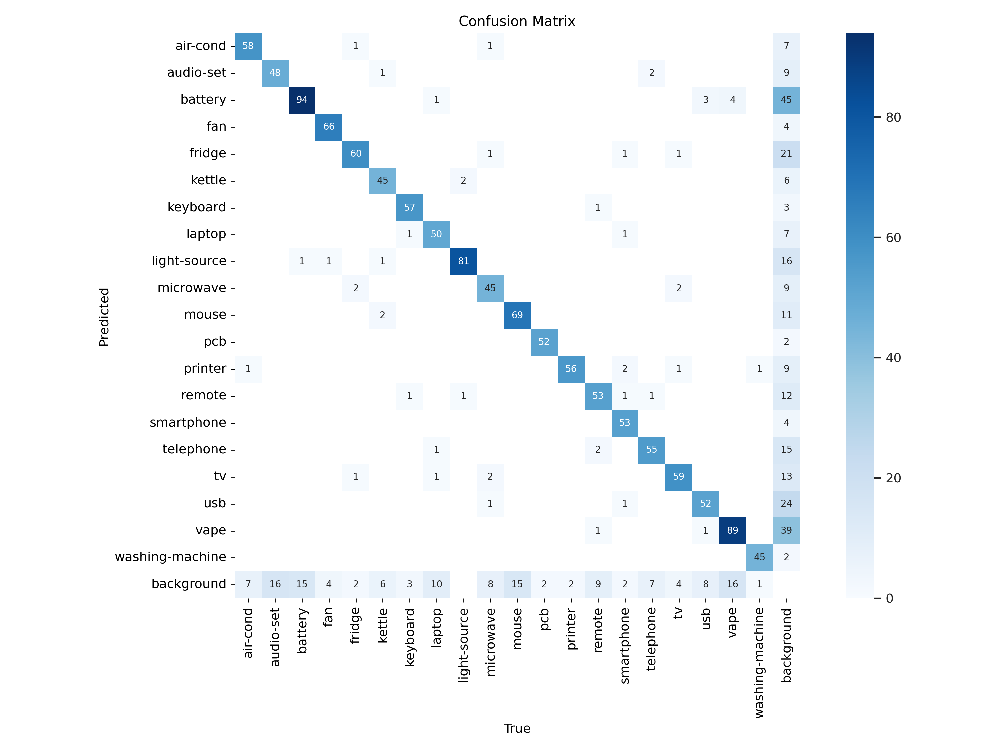

In [11]:
# Display the confusion matrix image generated during the training process
IPyImage(filename=f'{HOME}/e-waste-yolov9t/train/confusion_matrix.png', width=600)

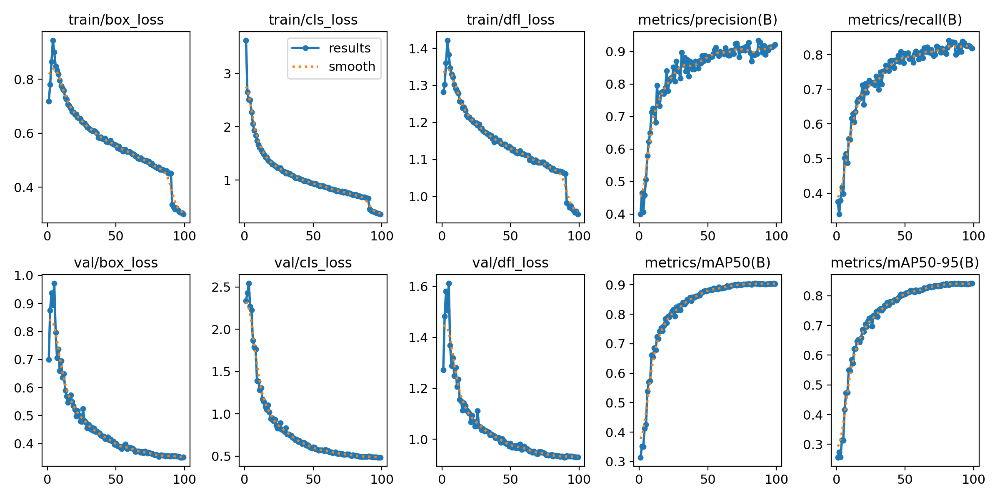

In [12]:
# Display the training results graph, which includes metrics such as loss, precision, recall, and mAP
IPyImage(filename=f'{HOME}/e-waste-yolov9t/train/results.png', width=600)

In [13]:
# Start TensorBoard for interactive analysis of training logs
# The logs generated during the training process are stored in the "e-waste-yolov9t/train" directory
%load_ext tensorboard
%tensorboard --logdir e-waste-yolov9t/train

<IPython.core.display.Javascript object>

# 📊 **5.0 Validate Fine-Tuned Model**

In [14]:
# Validate the trained YOLOv9 model on the validation dataset
!yolo task=detect mode=val \
model={HOME}/e-waste-yolov9t/train/weights/best.pt \
data={HOME}/data.yaml \
project=e-waste-yolov9t \
name=val \
exist_ok=True \
save=True

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9t summary (fused): 486 layers, 1,974,684 parameters, 0 gradients, 7.6 GFLOPs
val: Scanning /content/valid/labels.cache... 1000 images, 0 backgrounds, 0 corrupt: 100% 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 63/63 [00:06<00:00,  9.05it/s]
                   all       1000       1374      0.911      0.822      0.904      0.842
              air-cond         51         66          1      0.803      0.916      0.853
             audio-set         53         64      0.902      0.688      0.782        0.7
               battery         51        110      0.787      0.745      0.822      0.696
                   fan         57         71       0.97      0.908      0.948      0.904
                fridge         56         66      0.878      0.833      0.946      0.883
                kettle         50         55      0.956   

# 🤖 **6.0 Inference with Custom Model**

In [15]:
# Use the trained YOLOv9 model to make predictions on test images
!yolo task=detect mode=predict \
model={HOME}/e-waste-yolov9t/train/weights/best.pt \
conf=0.25 \
source={HOME}/test/images \
project=e-waste-yolov9t \
name=predict \
exist_ok=True \
save=True

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9t summary (fused): 486 layers, 1,974,684 parameters, 0 gradients, 7.6 GFLOPs

image 1/1000 /content/test/images/air-cond-102-_jpg.rf.869fa33f896e77e27819573f7537f596.jpg: 640x640 1 microwave, 19.1ms
image 2/1000 /content/test/images/air-cond-111-_jpg.rf.4f257bdf2535a99469b669e81c3d7adb.jpg: 640x640 1 air-cond, 18.1ms
image 3/1000 /content/test/images/air-cond-114-_jpg.rf.7d55b45ef63b26be44bf0db4480f7cd7.jpg: 640x640 1 air-cond, 18.0ms
image 4/1000 /content/test/images/air-cond-119-_jpg.rf.37793ea449e083ef1a62db76cde9567c.jpg: 640x640 1 air-cond, 17.7ms
image 5/1000 /content/test/images/air-cond-132-_jpg.rf.56c70b243c0d7c54fe43b2c9359fdd7f.jpg: 640x640 2 air-conds, 1 fridge, 1 microwave, 3 tvs, 18.3ms
image 6/1000 /content/test/images/air-cond-141-_jpg.rf.7bcd9f5bf135009d9d2fb96ff7706628.jpg: 640x640 1 air-cond, 19.4ms
image 7/1000 /content/test/images/air-cond-158-_jpg.rf.3af1af646b29ac5c99ee9a47f1

In [16]:
# Plot and visualize images in a 1x1 or 2x2 grid, based on the number of images available
def visualize(result_dir):
    """
    This function accepts a directory path containing images and visualizes them
    - If there are fewer than 4 images, it plots them in a 1x1 grid.
    - If there are 4 or more images, it plots them in a 2x2 grid.
    """

    image_names = glob.glob(os.path.join(result_dir, '*.jpg')) # Get all JPG image file paths from the directory
    if len(image_names) < 4:
        plt.figure(figsize=(10, 7)) # Create a figure for fewer than 4 images
        for i, image_name in enumerate(image_names):
            image = plt.imread(image_name)
            plt.subplot(1, 1, i+1) # Create a 1x1 subplot for each image
            plt.imshow(image)
            plt.axis('off')
            break
    if len(image_names) >= 4:
        plt.figure(figsize=(15, 12)) # Create a figure for 4 or more images
        for i, image_name in enumerate(image_names):
            image = plt.imread(image_name)
            plt.subplot(2, 2, i+1) # Create a 2x2 subplot for the first 4 images
            plt.imshow(image)
            plt.axis('off')
            if i == 3: # Stop after plotting 4 images
                break

    plt.title('Inference Results', fontsize=20) # Set the title of the plot
    plt.tight_layout() # Adjust the layout for better spacing
    plt.show() # Display the plot

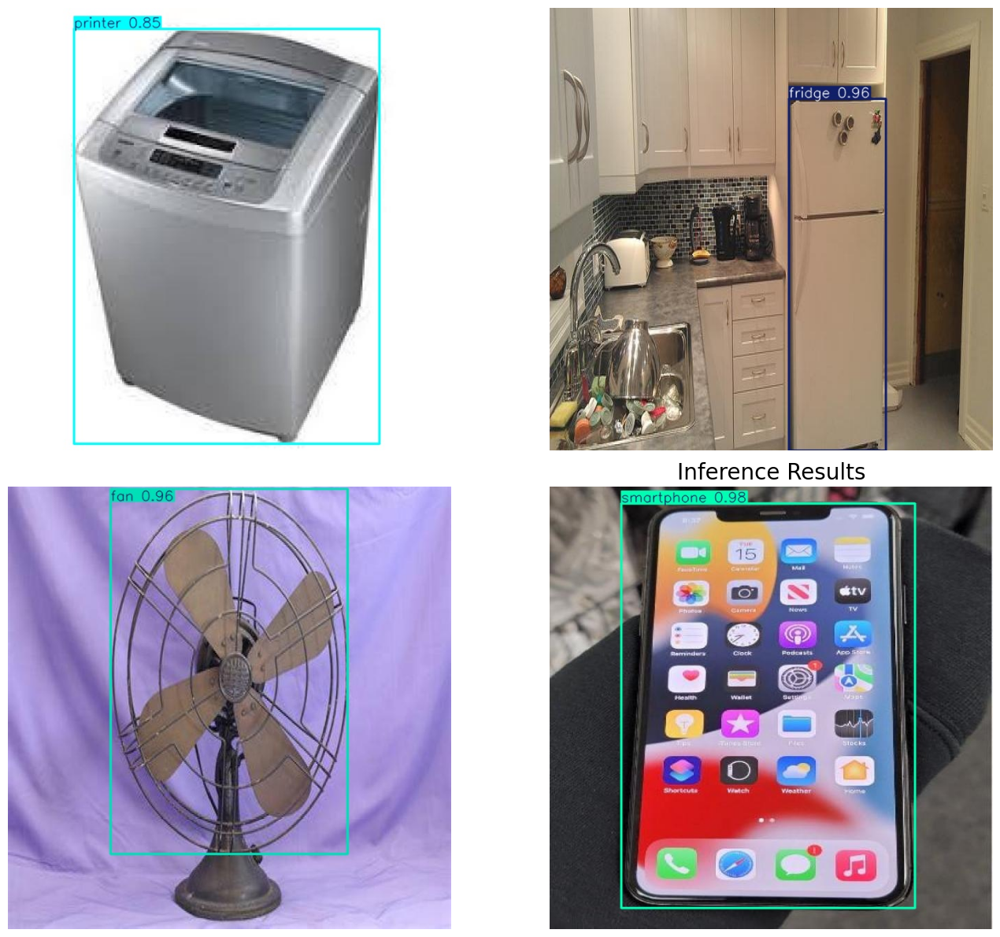

In [17]:
# Call the visualize function to display prediction results
visualize('/content/e-waste-yolov9t/predict')

# **📂 Compress and Download Folder**
This section zips the `e-waste-yolov9t` folder and provides a downloadable file for local storage or further use. The steps include:

* Compressing the folder into a `.zip` archive.
* Automatically initiating the download of the zipped file.

In [18]:
import shutil
from google.colab import files

# Define the folder name and output ZIP file name
folder_name = "e-waste-yolov9t"
zip_file_name = f"{folder_name}.zip"

# Zip the folder
shutil.make_archive(folder_name, 'zip', folder_name)

# Download the zipped folder
files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 🌟 **End of the YOLOv9t Training**